In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
# import pylab as py
import itertools

In [2]:
# gut microbes
gut_microbes = pd.read_csv("../data/raw/gut_16s_abundance.txt", sep = "\t")
gut_microbes

,SampleID,phylum_Actinobacteria,phylum_Bacteroidetes,phylum_Firmicutes,phylum_Proteobacteria,phylum_Verrucomicrobia,phylum_unclassified_Bacteria,class_Actinobacteria,class_Bacilli,class_Bacteroidia,...,genus_Veillonella,genus_unclassified_Bacteria,genus_unclassified_Clostridiales,genus_unclassified_Clostridiales_Incertae.Sedis.XIII,genus_unclassified_Coriobacteriaceae,genus_unclassified_Erysipelotrichaceae,genus_unclassified_Firmicutes,genus_unclassified_Lachnospiraceae,genus_unclassified_Porphyromonadaceae,genus_unclassified_Ruminococcaceae
0,ZOZOW1T-1010,0.000449,0.650866,0.225080,0.007364,0.015835,0.097431,0.000449,0.000138,0.650866,...,0.000000,0.097431,0.007883,0.000035,0.000415,0.002386,0.015697,0.027452,0.000000,0.074128
1,ZOZOW1T-1011,0.000176,0.730518,0.184808,0.003900,0.008186,0.070902,0.000176,0.000070,0.730518,...,0.000035,0.070902,0.008713,0.000141,0.000176,0.000808,0.008608,0.011805,0.000000,0.069215
2,ZOZOW1T-1012,0.000597,0.178364,0.796861,0.000358,0.002788,0.020911,0.000597,0.000119,0.178364,...,0.000080,0.020911,0.022903,0.000518,0.000398,0.001713,0.000876,0.018362,0.000000,0.615351
3,ZOZOW1T-1015,0.000058,0.740726,0.226516,0.005977,0.001207,0.024971,0.000058,0.000029,0.740726,...,0.000029,0.024971,0.013046,0.000086,0.000029,0.004109,0.007730,0.043849,0.000029,0.067096
4,ZOZOW1T-1021,0.001113,0.554580,0.364195,0.038358,0.000059,0.041286,0.001113,0.000059,0.554580,...,0.000410,0.041286,0.006208,0.000117,0.000176,0.000468,0.000996,0.132584,0.015753,0.044624
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
850,ZJTKAE3-2012,0.000333,0.618688,0.376535,0.004055,0.000333,0.000000,0.000333,0.001500,0.618688,...,0.000278,0.000000,0.001111,0.000111,0.000278,0.003333,0.000000,0.010666,0.579190,0.006222
851,ZJTKAE3-2013,0.000464,0.800232,0.171435,0.008732,0.000139,0.000418,0.000464,0.000139,0.800232,...,0.000046,0.000418,0.000697,0.000046,0.000464,0.001579,0.000000,0.009661,0.635764,0.021273
852,ZJTKAE3-2015,0.009662,0.532156,0.445728,0.010115,0.000151,0.000377,0.009662,0.000453,0.532156,...,0.000000,0.000377,0.001057,0.002415,0.007397,0.022418,0.000000,0.030571,0.018267,0.035854
853,ZJTKAE3-6011,0.002607,0.776424,0.204213,0.002080,0.013300,0.001318,0.002607,0.000293,0.774578,...,0.000000,0.001318,0.038903,0.003281,0.000205,0.018016,0.000029,0.009784,0.001728,0.021649


In [3]:
# subject data
subject_info = pd.read_csv("../data/raw/subject_file.csv")
subject_info

,SubjectID,Study,Race,Sex,Age,BMI,SSPG,IR_IS_classification
0,ZIS22OE,HMP,C,F,NaN,NaN,NaN,Unknown
1,ZJBOZ2X,Exercise,C,F,65.30,19.82,NaN,Unknown
2,ZJOSZHK,HMP,C,M,41.43,19.42,NaN,Unknown
3,ZJTKAE3,HMP,C,F,58.65,31.24,162.0,IR
4,ZJXC41N,"HMP, Exercise",B,F,49.69,28.24,75.0,IS
...,...,...,...,...,...,...,...,...
102,ZYHHR4Z,"HMP, Exercise",C,F,43.99,26.47,NaN,Unknown
103,ZYKZ9HQ,HMP,unknown,F,55.62,29.94,NaN,Unknown
104,ZYLJ7R7,HMP,A,F,40.97,23.45,NaN,Unknown
105,ZYU89T9,HMP,C,F,60.19,29.83,NaN,Unknown


# Subject Data EDA

### `Study`
- categorical:
    - HMP (Human Microbiome Project, 71)
    - HMP, Exercise (Human Microbiome Project & Exercise, 35)
    - Exercise (1)

### `Race`
- categorical: 
    - C (Caucasian, 70)
    - A (Asian, 24)
    - B (Black, 6)
    - H (Hispanic, 4)
    - Unknown (3)

### `Sex`
- categorical:
    - F (Female, 56)
    - M (Male, 51)
    
### `Age`
- continuous

### `BMI`
- continuous

### `SSPG`: Steady-State Plasma Glucose
- continuous

### `IR_IS_classification`
- categorical:
    - IR (insulin-resistant, 35)
    - IS (insulin-sensitive, 31)
    - Unknown (41)

In [4]:
# e.g. for race, might need to find more data

In [5]:
subject_info_IR = subject_info[subject_info['IR_IS_classification'] == 'IR']
subject_info_IS = subject_info[subject_info['IR_IS_classification'] == 'IS']
subject_info_unknown = subject_info[subject_info['IR_IS_classification'] == 'Unknown']

In [6]:
subject_info[['Sex', 'IR_IS_classification']]

,Sex,IR_IS_classification
0,F,Unknown
1,F,Unknown
2,M,Unknown
3,F,IR
4,F,IS
...,...,...
102,F,Unknown
103,F,Unknown
104,F,Unknown
105,F,Unknown


<Axes: xlabel='Sex'>

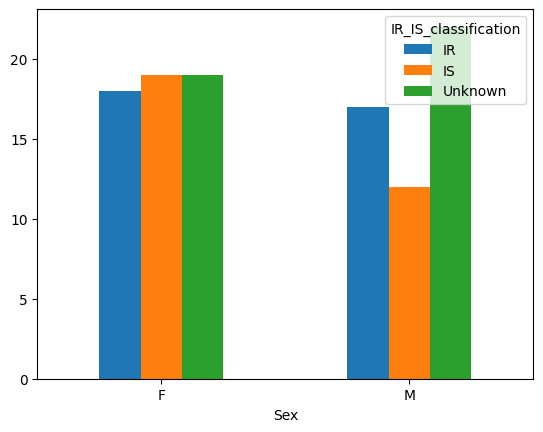

In [7]:
sex = subject_info.pivot_table(index='Sex', columns='IR_IS_classification', aggfunc='size')
sex.plot(kind='bar', rot=0)

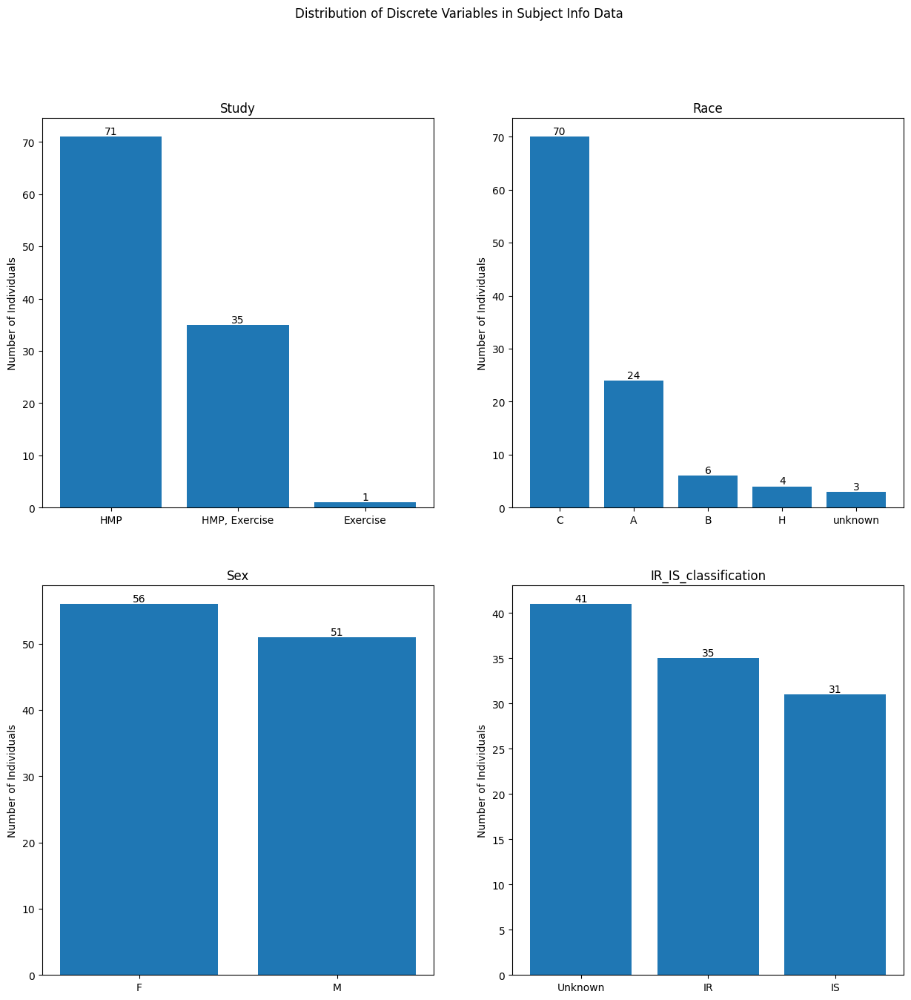

In [8]:
# categorical, binary variables
# make bar chart

fig, axs = plt.subplots(2, 2, figsize=(15, 15))
fig.suptitle('Distribution of Discrete Variables in Subject Info Data')
discrete_var = ['Study', 'Race', 'Sex', 'IR_IS_classification']

axs = axs.ravel()

for i in range(len(discrete_var)):
    col = discrete_var[i]
    value_counts = dict(subject_info[col].value_counts())
    bar = axs[i].bar(list(value_counts.keys()), list(value_counts.values()))
    axs[i].set_title(col)
    axs[i].set_ylabel('Number of Individuals')
    axs[i].bar_label(bar)
    
plt.show()

In [24]:
discrete_var = ['Study', 'Race', 'Sex']
not set(discrete_var).issubset(subject_info.columns)

False

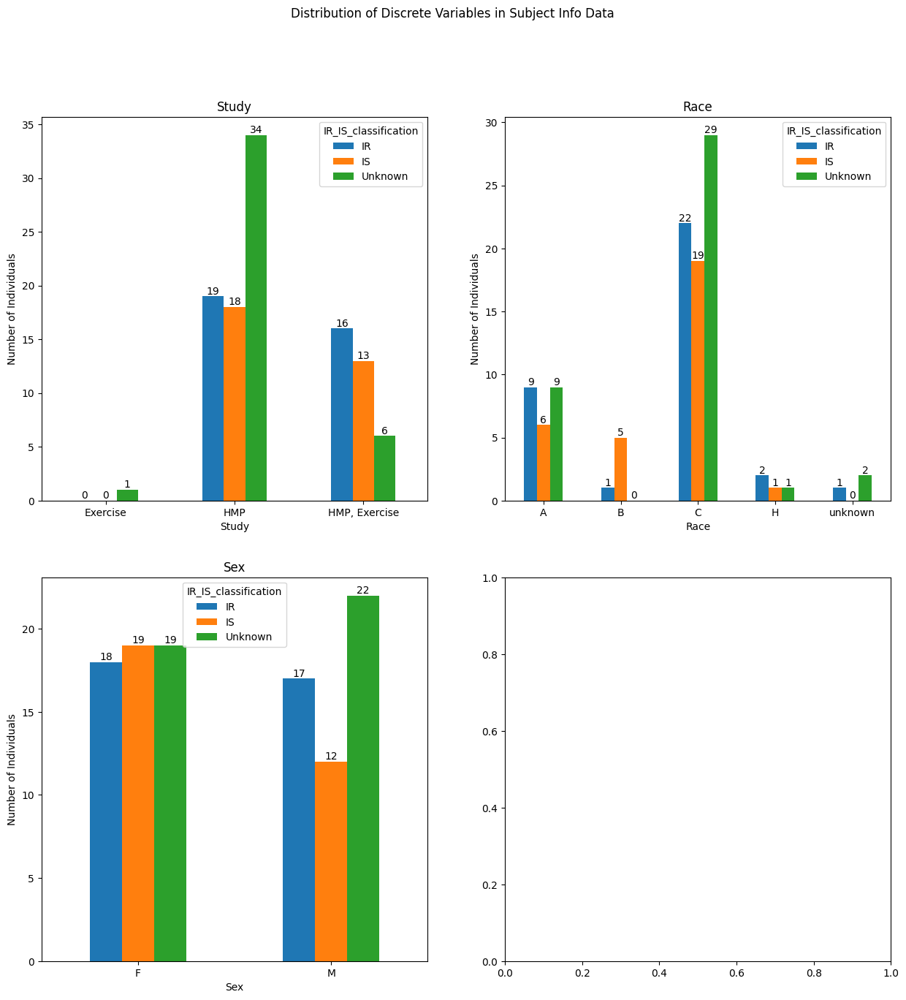

In [9]:
# categorical, binary variables
# make bar chart

fig, axs = plt.subplots(2, 2, figsize=(15, 15))
fig.suptitle('Distribution of Discrete Variables in Subject Info Data')
discrete_var = ['Study', 'Race', 'Sex']
groups = ['IR', 'IS', 'unknown']

axs = axs.ravel()

for i in range(len(discrete_var)):
    col = discrete_var[i]
    
    dfp = subject_info.pivot_table(index=col, columns='IR_IS_classification', aggfunc='size')
    dfp.plot(kind='bar', rot=0, ax=axs[i])
    # offset = width * multiplier
    
#     value_counts_IR = subject_info_IR[col].value_counts().values
#     value_counts_IS = subject_info_IS[col].value_counts().values
#     value_counts_unknown = subject_info_unknown[col].value_counts().values
    
#     bar = axs[i].bar(x - width, value_counts_IR, width)
#     bar = axs[i].bar(x, value_counts_IS, width)
#     bar = axs[i].bar(x + width, value_counts_unknown, width)
    axs[i].set_title(col)
    axs[i].set_ylabel('Number of Individuals')
    # axs[i].bar_label(axs[i].containers)
    for container in axs[i].containers:
        axs[i].bar_label(container)
    
plt.show()

Number of NaNs: 1
Number of NaNs: 3
Number of NaNs: 41


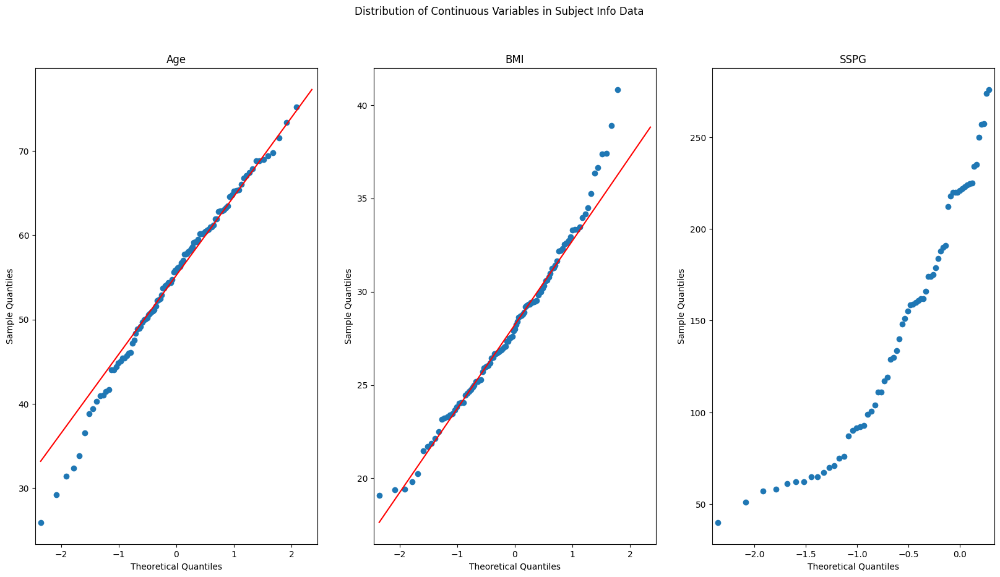

In [10]:
# continuous variables
# check Gaussian

fig, axs = plt.subplots(1, 3, figsize=(20, 10))
fig.suptitle('Distribution of Continuous Variables in Subject Info Data')
continuous_var = ['Age', 'BMI', 'SSPG']

for i in range(len(continuous_var)):
    col = continuous_var[i]
    print('Number of NaNs:', subject_info[col].isna().sum())
    sm.qqplot(subject_info[col], line='q', ax=axs[i])
    axs[i].set_title(col)
    
plt.show()

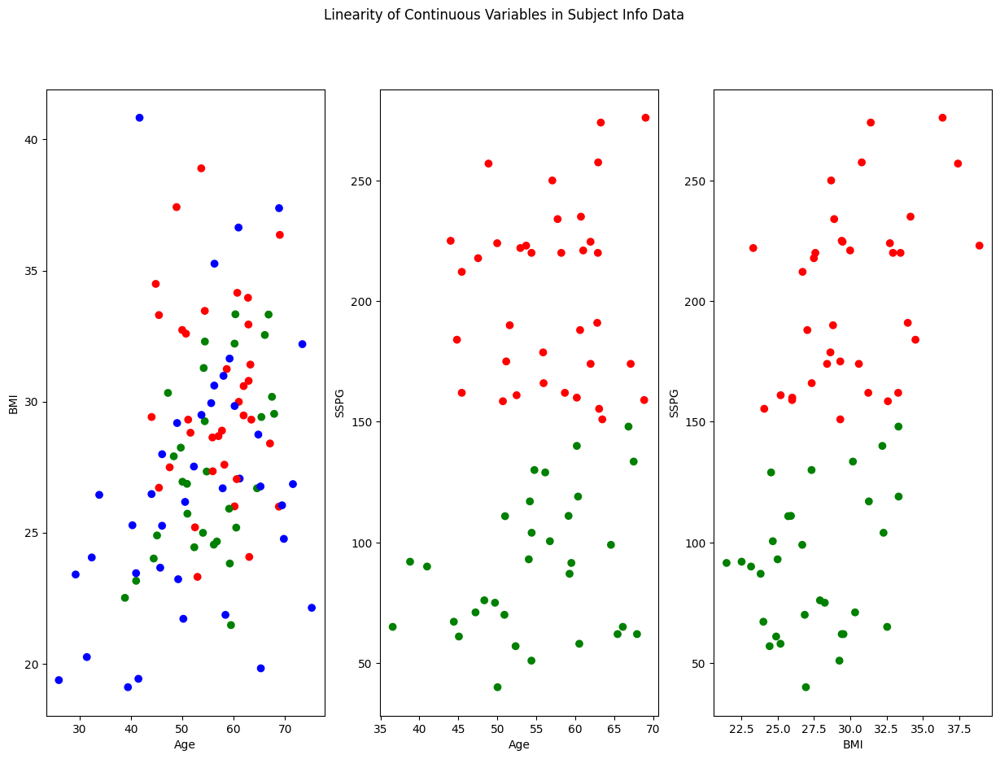

In [11]:
# continuous variables
# check linear

fig, axs = plt.subplots(1, 3, figsize=(15, 10))
fig.suptitle('Linearity of Continuous Variables in Subject Info Data')
pairs = list(itertools.combinations(continuous_var, 2))
colors = {'IR': 'red', 'IS': 'green', 'Unknown': 'blue'}

for i in range(len(continuous_var)):
    x = subject_info[pairs[i][0]]
    y = subject_info[pairs[i][1]]
    c = [colors.get(i) for i in subject_info['IR_IS_classification']]
    axs[i].scatter(x, y, c=c)
    axs[i].set_xlabel(pairs[i][0])
    axs[i].set_ylabel(pairs[i][1])

# Gut Microbes

In [12]:
genus_col = []
for col in gut_microbes.columns:
    if 'genus' in col:
        genus_col.append(col)

gut_microbes_genera = gut_microbes[['SampleID'] + genus_col]
gut_microbes_genera

,SampleID,genus_Akkermansia,genus_Alistipes,genus_Anaerotruncus,genus_Anaerovorax,genus_Bacteroides,genus_Barnesiella,genus_Bilophila,genus_Blautia,genus_Butyricicoccus,...,genus_Veillonella,genus_unclassified_Bacteria,genus_unclassified_Clostridiales,genus_unclassified_Clostridiales_Incertae.Sedis.XIII,genus_unclassified_Coriobacteriaceae,genus_unclassified_Erysipelotrichaceae,genus_unclassified_Firmicutes,genus_unclassified_Lachnospiraceae,genus_unclassified_Porphyromonadaceae,genus_unclassified_Ruminococcaceae
0,ZOZOW1T-1010,0.015835,0.020572,0.000035,0.000484,0.589289,0.000588,0.000000,0.009854,0.000173,...,0.000000,0.097431,0.007883,0.000035,0.000415,0.002386,0.015697,0.027452,0.000000,0.074128
1,ZOZOW1T-1011,0.008186,0.026035,0.000070,0.000211,0.625009,0.001405,0.000000,0.004146,0.000070,...,0.000035,0.070902,0.008713,0.000141,0.000176,0.000808,0.008608,0.011805,0.000000,0.069215
2,ZOZOW1T-1012,0.002788,0.004063,0.000199,0.000358,0.163706,0.000279,0.000000,0.019836,0.000040,...,0.000080,0.020911,0.022903,0.000518,0.000398,0.001713,0.000876,0.018362,0.000000,0.615351
3,ZOZOW1T-1015,0.001207,0.009368,0.000000,0.000316,0.691043,0.000718,0.000000,0.013275,0.000172,...,0.000029,0.024971,0.013046,0.000086,0.000029,0.004109,0.007730,0.043849,0.000029,0.067096
4,ZOZOW1T-1021,0.000059,0.010248,0.000117,0.000293,0.488053,0.002987,0.000000,0.008784,0.000527,...,0.000410,0.041286,0.006208,0.000117,0.000176,0.000468,0.000996,0.132584,0.015753,0.044624
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
850,ZJTKAE3-2012,0.000333,0.001944,0.000000,0.000111,0.036720,0.000000,0.000056,0.012999,0.000722,...,0.000278,0.000000,0.001111,0.000111,0.000278,0.003333,0.000000,0.010666,0.579190,0.006222
851,ZJTKAE3-2013,0.000139,0.003948,0.000046,0.000000,0.156015,0.000000,0.000000,0.002926,0.000093,...,0.000046,0.000418,0.000697,0.000046,0.000464,0.001579,0.000000,0.009661,0.635764,0.021273
852,ZJTKAE3-2015,0.000151,0.007775,0.000302,0.000302,0.499849,0.000000,0.000302,0.031627,0.001208,...,0.000000,0.000377,0.001057,0.002415,0.007397,0.022418,0.000000,0.030571,0.018267,0.035854
853,ZJTKAE3-6011,0.013300,0.023699,0.000498,0.001611,0.742764,0.000000,0.000029,0.010898,0.000439,...,0.000000,0.001318,0.038903,0.003281,0.000205,0.018016,0.000029,0.009784,0.001728,0.021649


# Merged DataFrame

In [13]:
def make_corr_plot(data):
    corr = data.corr()
    full_columns = list(data.columns)

    fig = plt.figure(figsize=(20, 20))
    ax = fig.add_subplot()
    cax = ax.matshow(corr, cmap='coolwarm')
    fig.colorbar(cax)

    xaxis = np.arange(len(full_columns))
    ax.set_xticks(xaxis)
    ax.set_yticks(xaxis)
    ax.set_xticklabels(full_columns, rotation=90)
    ax.set_yticklabels(full_columns)

    fig.show()

    return

In [14]:
gut_microbes_genera['SubjectID'] = gut_microbes['SampleID'].str.split('-').str[0]

merged_df = pd.merge(gut_microbes_genera, subject_info, on='SubjectID', how='inner')
merged_df

/var/folders/hc/mnggsfz56v305wwb48gk6cjm0000gp/T/ipykernel_66709/474381260.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gut_microbes_genera['SubjectID'] = gut_microbes['SampleID'].str.split('-').str[0]


,SampleID,genus_Akkermansia,genus_Alistipes,genus_Anaerotruncus,genus_Anaerovorax,genus_Bacteroides,genus_Barnesiella,genus_Bilophila,genus_Blautia,genus_Butyricicoccus,...,genus_unclassified_Porphyromonadaceae,genus_unclassified_Ruminococcaceae,SubjectID,Study,Race,Sex,Age,BMI,SSPG,IR_IS_classification
0,ZOZOW1T-1010,0.015835,0.020572,0.000035,0.000484,0.589289,0.000588,0.000000,0.009854,0.000173,...,0.000000,0.074128,ZOZOW1T,"HMP, Exercise",C,M,59.48,21.47,91.5,IS
1,ZOZOW1T-1011,0.008186,0.026035,0.000070,0.000211,0.625009,0.001405,0.000000,0.004146,0.000070,...,0.000000,0.069215,ZOZOW1T,"HMP, Exercise",C,M,59.48,21.47,91.5,IS
2,ZOZOW1T-1012,0.002788,0.004063,0.000199,0.000358,0.163706,0.000279,0.000000,0.019836,0.000040,...,0.000000,0.615351,ZOZOW1T,"HMP, Exercise",C,M,59.48,21.47,91.5,IS
3,ZOZOW1T-1015,0.001207,0.009368,0.000000,0.000316,0.691043,0.000718,0.000000,0.013275,0.000172,...,0.000029,0.067096,ZOZOW1T,"HMP, Exercise",C,M,59.48,21.47,91.5,IS
4,ZOZOW1T-1021,0.000059,0.010248,0.000117,0.000293,0.488053,0.002987,0.000000,0.008784,0.000527,...,0.015753,0.044624,ZOZOW1T,"HMP, Exercise",C,M,59.48,21.47,91.5,IS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
850,ZJTKAE3-2012,0.000333,0.001944,0.000000,0.000111,0.036720,0.000000,0.000056,0.012999,0.000722,...,0.579190,0.006222,ZJTKAE3,HMP,C,F,58.65,31.24,162.0,IR
851,ZJTKAE3-2013,0.000139,0.003948,0.000046,0.000000,0.156015,0.000000,0.000000,0.002926,0.000093,...,0.635764,0.021273,ZJTKAE3,HMP,C,F,58.65,31.24,162.0,IR
852,ZJTKAE3-2015,0.000151,0.007775,0.000302,0.000302,0.499849,0.000000,0.000302,0.031627,0.001208,...,0.018267,0.035854,ZJTKAE3,HMP,C,F,58.65,31.24,162.0,IR
853,ZJTKAE3-6011,0.013300,0.023699,0.000498,0.001611,0.742764,0.000000,0.000029,0.010898,0.000439,...,0.001728,0.021649,ZJTKAE3,HMP,C,F,58.65,31.24,162.0,IR


In [15]:
X = merged_df.drop(columns=['SampleID', 'SubjectID', 'Study'])
X['Race'] = X['Race'].map({'C': 0, 'A': 1, 'B': 2, 'H': 3, 'unknown': 4})
X['Sex'] = X['Sex'].map({'M': 0, 'F': 1})
X['IR_IS_classification'] = X['IR_IS_classification'].map({'IR': 0, 'IS': 1, 'Unknown': 2})
X

,genus_Akkermansia,genus_Alistipes,genus_Anaerotruncus,genus_Anaerovorax,genus_Bacteroides,genus_Barnesiella,genus_Bilophila,genus_Blautia,genus_Butyricicoccus,genus_Butyricimonas,...,genus_unclassified_Firmicutes,genus_unclassified_Lachnospiraceae,genus_unclassified_Porphyromonadaceae,genus_unclassified_Ruminococcaceae,Race,Sex,Age,BMI,SSPG,IR_IS_classification
0,0.015835,0.020572,0.000035,0.000484,0.589289,0.000588,0.000000,0.009854,0.000173,0.000899,...,0.015697,0.027452,0.000000,0.074128,0,0,59.48,21.47,91.5,1
1,0.008186,0.026035,0.000070,0.000211,0.625009,0.001405,0.000000,0.004146,0.000070,0.001722,...,0.008608,0.011805,0.000000,0.069215,0,0,59.48,21.47,91.5,1
2,0.002788,0.004063,0.000199,0.000358,0.163706,0.000279,0.000000,0.019836,0.000040,0.000040,...,0.000876,0.018362,0.000000,0.615351,0,0,59.48,21.47,91.5,1
3,0.001207,0.009368,0.000000,0.000316,0.691043,0.000718,0.000000,0.013275,0.000172,0.000172,...,0.007730,0.043849,0.000029,0.067096,0,0,59.48,21.47,91.5,1
4,0.000059,0.010248,0.000117,0.000293,0.488053,0.002987,0.000000,0.008784,0.000527,0.001405,...,0.000996,0.132584,0.015753,0.044624,0,0,59.48,21.47,91.5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
850,0.000333,0.001944,0.000000,0.000111,0.036720,0.000000,0.000056,0.012999,0.000722,0.000000,...,0.000000,0.010666,0.579190,0.006222,0,1,58.65,31.24,162.0,0
851,0.000139,0.003948,0.000046,0.000000,0.156015,0.000000,0.000000,0.002926,0.000093,0.000000,...,0.000000,0.009661,0.635764,0.021273,0,1,58.65,31.24,162.0,0
852,0.000151,0.007775,0.000302,0.000302,0.499849,0.000000,0.000302,0.031627,0.001208,0.000000,...,0.000000,0.030571,0.018267,0.035854,0,1,58.65,31.24,162.0,0
853,0.013300,0.023699,0.000498,0.001611,0.742764,0.000000,0.000029,0.010898,0.000439,0.000000,...,0.000029,0.009784,0.001728,0.021649,0,1,58.65,31.24,162.0,0


/var/folders/hc/mnggsfz56v305wwb48gk6cjm0000gp/T/ipykernel_66709/2955896579.py:16: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


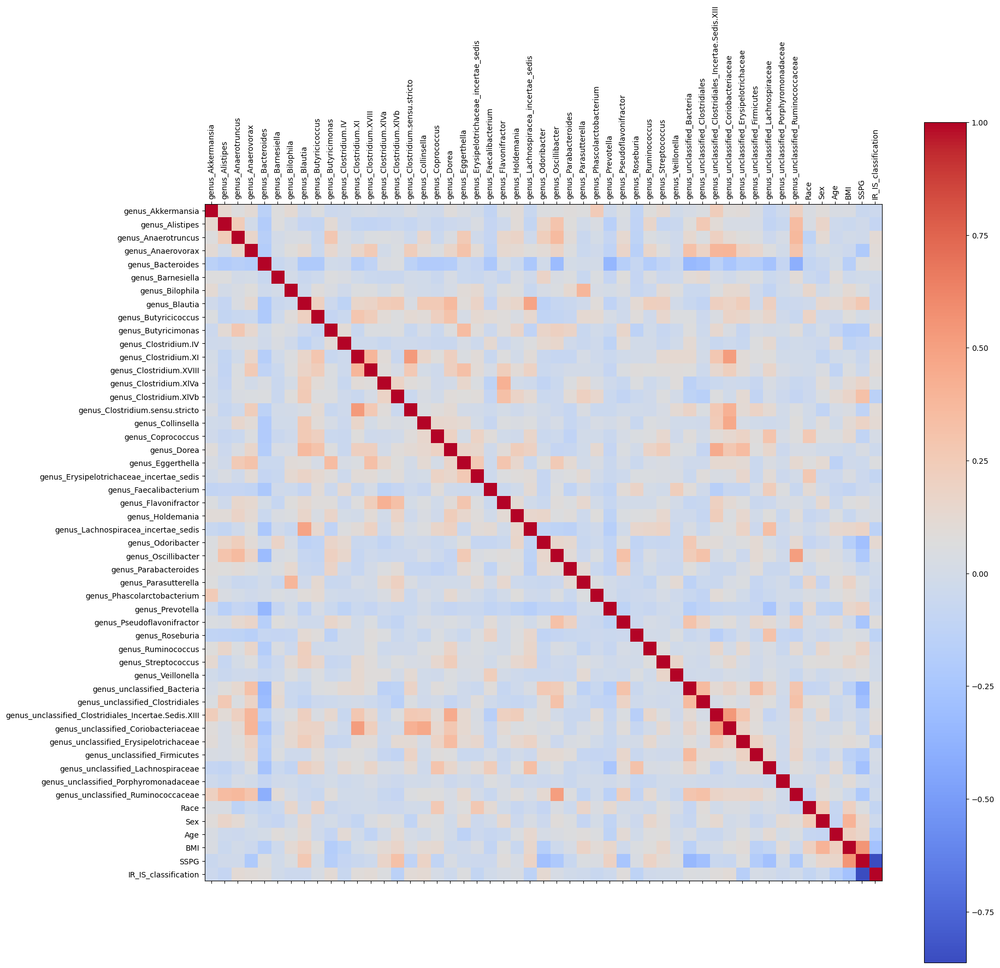

In [16]:
make_corr_plot(X)

/var/folders/hc/mnggsfz56v305wwb48gk6cjm0000gp/T/ipykernel_66709/2955896579.py:16: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/var/folders/hc/mnggsfz56v305wwb48gk6cjm0000gp/T/ipykernel_66709/2955896579.py:16: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


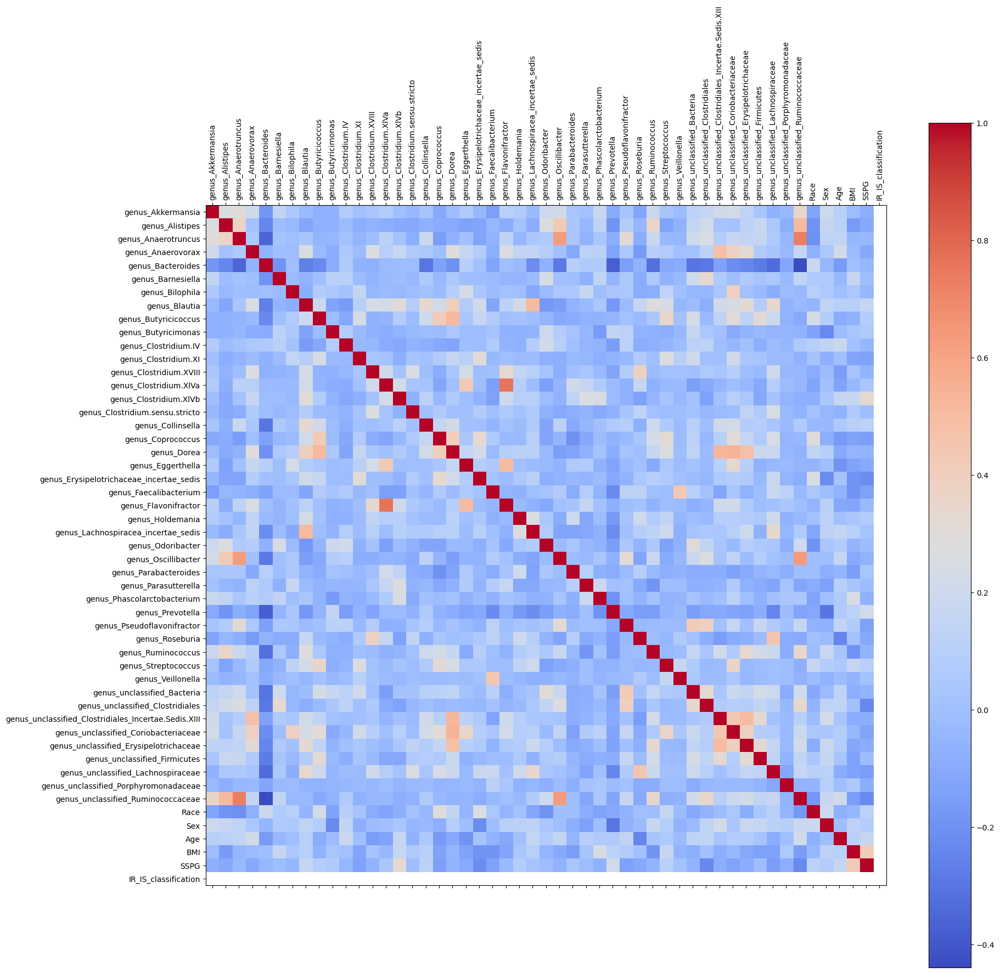

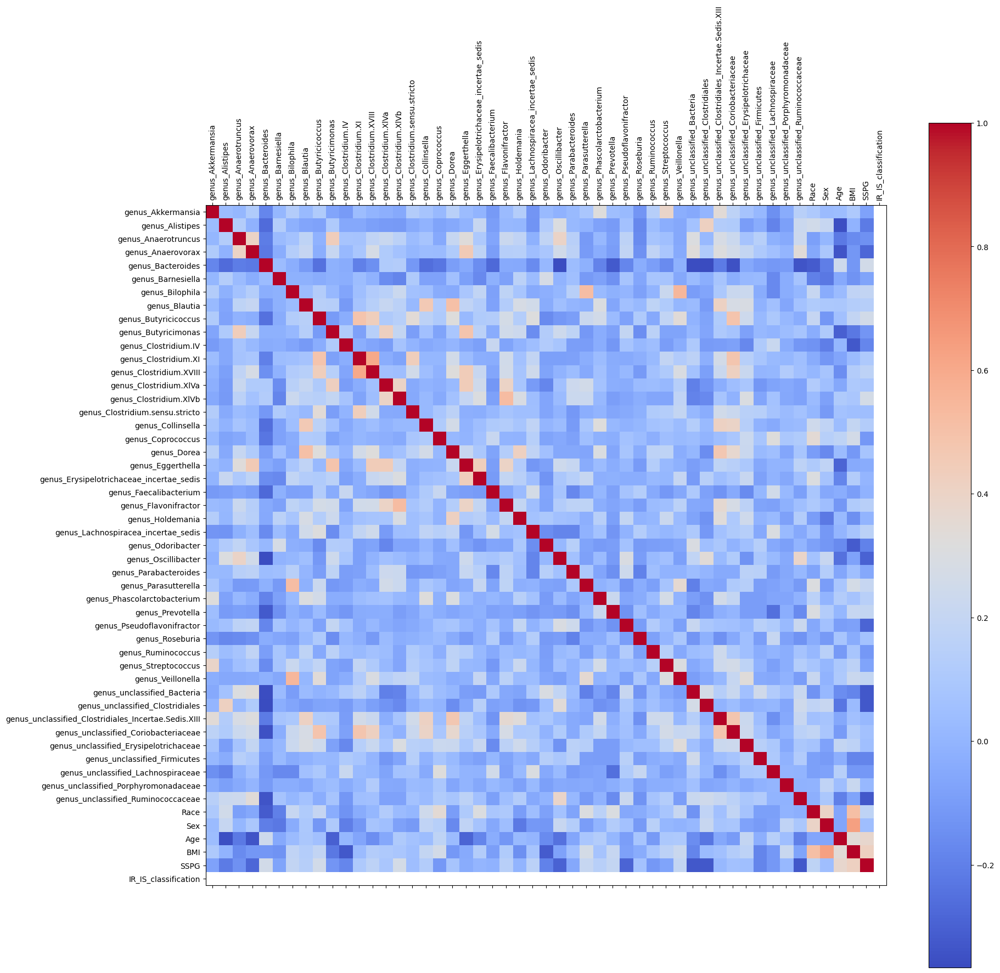

In [17]:
# correlations on IR vs IS
X_IR = X[X['IR_IS_classification'] == 0]
X_IS = X[X['IR_IS_classification'] == 1]
make_corr_plot(X_IR)
make_corr_plot(X_IS)

/var/folders/hc/mnggsfz56v305wwb48gk6cjm0000gp/T/ipykernel_50629/3651489610.py:17: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


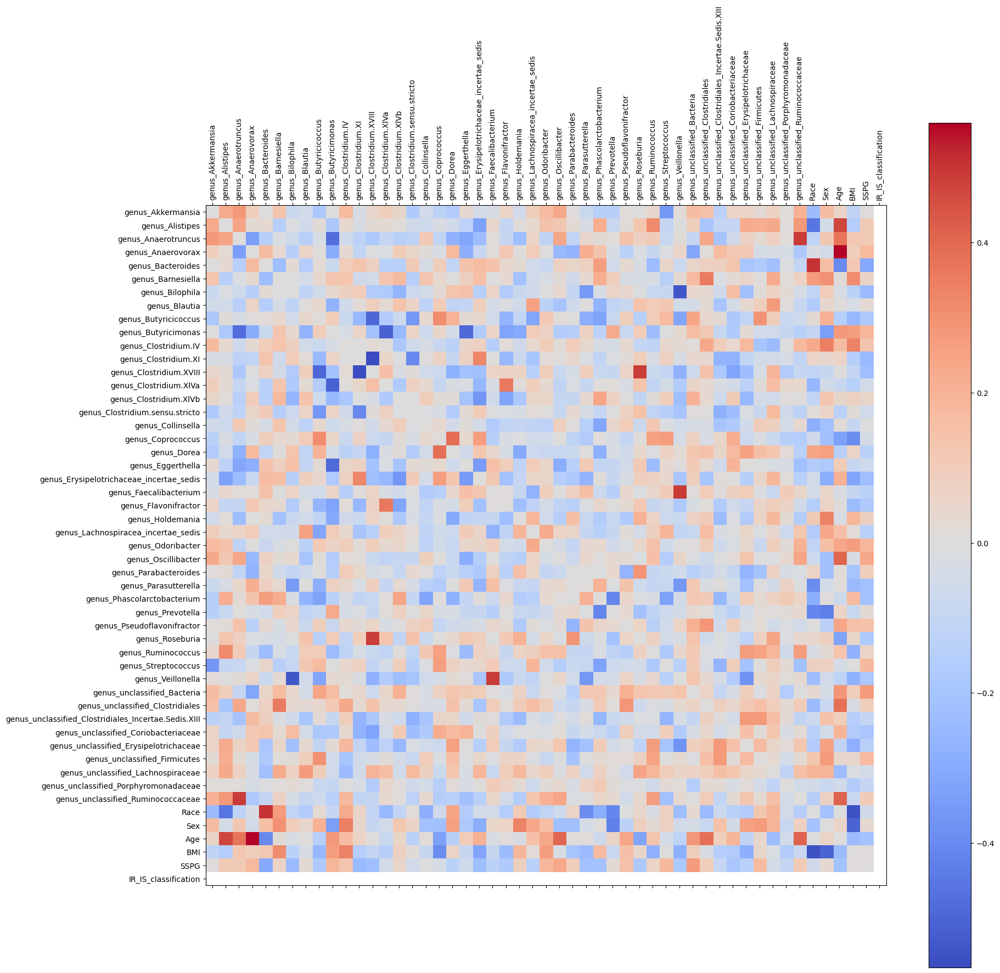

In [30]:
X_IR_corr = X_IR.corr()
X_IS_corr = X_IS.corr()
corr = X_IR_corr - X_IS_corr
full_columns = list(X_IR.columns)

fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot()
cax = ax.matshow(corr, cmap='coolwarm')
fig.colorbar(cax)

xaxis = np.arange(len(full_columns))
ax.set_xticks(xaxis)
ax.set_yticks(xaxis)
ax.set_xticklabels(full_columns, rotation=90)
ax.set_yticklabels(full_columns)

fig.show()

In [25]:
pairs_X = list(itertools.combinations(X.columns, 2))

In [29]:
(len(pairs_X) / 5) * 3

765.0

In [22]:
fig, axs = plt.subplots(255, 5, figsize=(20, 700))
fig.suptitle('Distribution of Discrete Variables in Subject Info Data')

pairs_X = list(itertools.combinations(X.columns, 2))

axs = axs.ravel()

for i in range(len(pairs_X)):
    x = pairs_X[i][0]
    y = pairs_X[i][1]
    axs[i].scatter(x = X[x], y = X[y])
    axs[i].set_xlabel(x)
    axs[i].set_ylabel(y)
    
fig.subplots_adjust(top=0.975, wspace=0.2, hspace=0.15)